In [ ]:
from basic_Nab_analysis import *
import pyNab as Nab
from tqdm import tqdm

import numpy as np #import for efficient C styled arrays
import matplotlib.pyplot as plt #import for plotting
import os #import to help with finding files and calling scripts
%matplotlib notebook
plt.rcParams['figure.figsize'] = [8, 5]

In [2]:
figDir = "/Users/leenderthayen/git/NDP/analysis/figures/"
figPrefix = "cooling_test_"

fileDir = "/Users/leenderthayen/git/NDP/data/UoM/temp_scan_7_7/"

subDirs = {-150: ("7_8_150C/", [522, 524, 523, 525]), 
           -72: ("7_9_72C/", [529, 531, 530, 532]), 
           -132: ("7_10_132C/", [402, 405, 403, 402]), 
           -144: ("7_11_144C/", [411, 415, 413, 417])}

keys = ["Cd 1", "p+", "BG", "Cd 2"]

In [3]:
Nab.DataRun(fileDir + subDirs[-132][0], 402)

Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers


In [4]:
dataRuns = dict()
for t, s in tqdm(subDirs.items()):
    fnrs = s[1]
    runs = dict()
    for i in range(len(fnrs)):
        runs[keys[i]] = Nab.DataRun(fileDir + s[0], fnrs[i])
    dataRuns[t] = runs

  0%|          | 0/4 [00:00<?, ?it/s]

Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers


 25%|██▌       | 1/4 [00:37<01:53, 37.85s/it]

Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers


 50%|█████     | 2/4 [01:39<01:43, 51.74s/it]

Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers


 75%|███████▌  | 3/4 [02:15<00:44, 44.81s/it]

Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers
Number of Channels != len(BoardChannelPixelMap): 112 != 109
Possibly an error in DAQ Configuration File: BoardChannelToPixelMap.csv
Code not exiting, continuing to load
Any unasigned channels will be mapped to negative numbers


100%|██████████| 4/4 [02:54<00:00, 43.64s/it]


In [ ]:
dataRuns

In [5]:
results = dict()
for t in dataRuns.keys():
    singleResults = dict()
    for k in keys:
       singleResults[k] = dataRuns[t][k].singleWaves().determineEnergyTiming(method='trap', params=[100, 10, 1250], batchsize=20000)
    results[t] = singleResults

100%|██████████| 4/4 [00:34<00:00,  8.60s/it]


In [47]:
binWidth = 0.2
bins = np.arange(0, 200, binWidth)
hitsDict = dict()
bcs = np.arange(17, 23)
for t in results.keys():
    singleHitsDict = dict()
    for k in keys:
        res = results[t][k]
        hists = np.zeros((127, len(bins)-1))
        pixelMapping = dataRuns[t][k].parameterFile().BoardChannelPixelMap
        for bc in bcs:
            res.resetCuts()
            res.defineCut('bc', '=', bc)
            res.defineCut('t0', 'between', 3000, 4000)
            hist, _ = np.histogram(res.data()["energy"], bins=bins)
            pixel = pixelMapping['pixel'][pixelMapping['bc']==bc]
            hists[pixel-1, :] = hist
        singleHitsDict[k] = hists
    hitsDict[t] = singleHitsDict

In [52]:
print(dataRuns)
print(hitsDict.keys())

{-150: {'Cd 1': <pyNab.DataRun object at 0x1d48b0ac0>, 'p+': <pyNab.DataRun object at 0x1d48d2e20>, 'BG': <pyNab.DataRun object at 0x2494ba9d0>, 'Cd 2': <pyNab.DataRun object at 0x2a7876cd0>}, -72: {'Cd 1': <pyNab.DataRun object at 0x1d48b09d0>, 'p+': <pyNab.DataRun object at 0x353ff4190>, 'BG': <pyNab.DataRun object at 0x3f47d38e0>, 'Cd 2': <pyNab.DataRun object at 0x47d6f9910>}, -132: {'Cd 1': <pyNab.DataRun object at 0x584f927f0>, 'p+': <pyNab.DataRun object at 0x584fb5c10>, 'BG': <pyNab.DataRun object at 0x2a7876f40>, 'Cd 2': <pyNab.DataRun object at 0x6e154f1c0>}, -144: {'Cd 1': <pyNab.DataRun object at 0x80d039670>, 'p+': <pyNab.DataRun object at 0x80d058c40>, 'BG': <pyNab.DataRun object at 0x8a4c80dc0>, 'Cd 2': <pyNab.DataRun object at 0x4e5f48a60>}}
dict_keys([-150, -72, -132, -144])


<IPython.core.display.Javascript object>


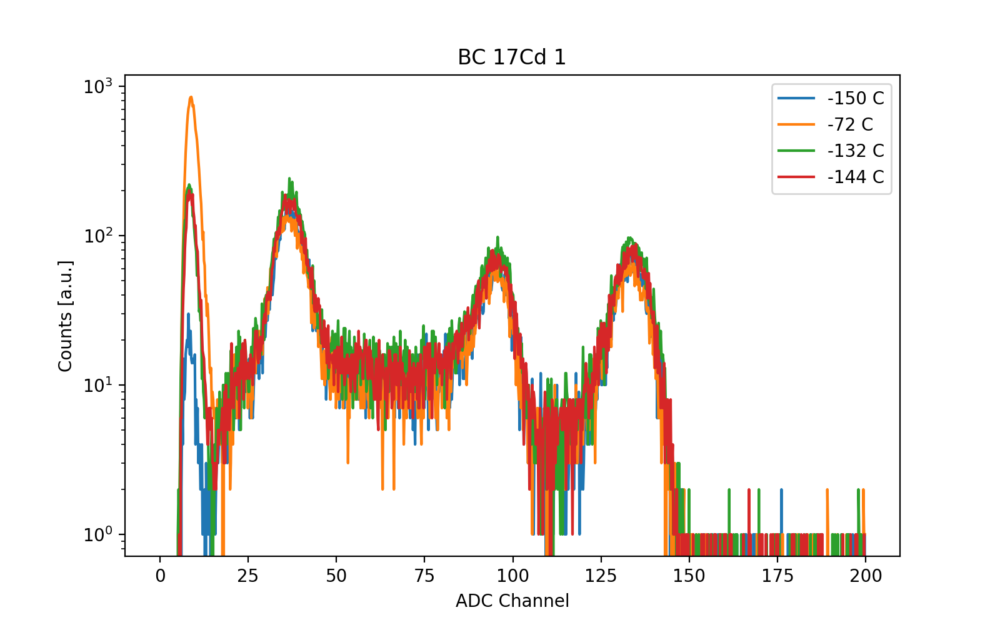

76
76
76
76


<IPython.core.display.Javascript object>


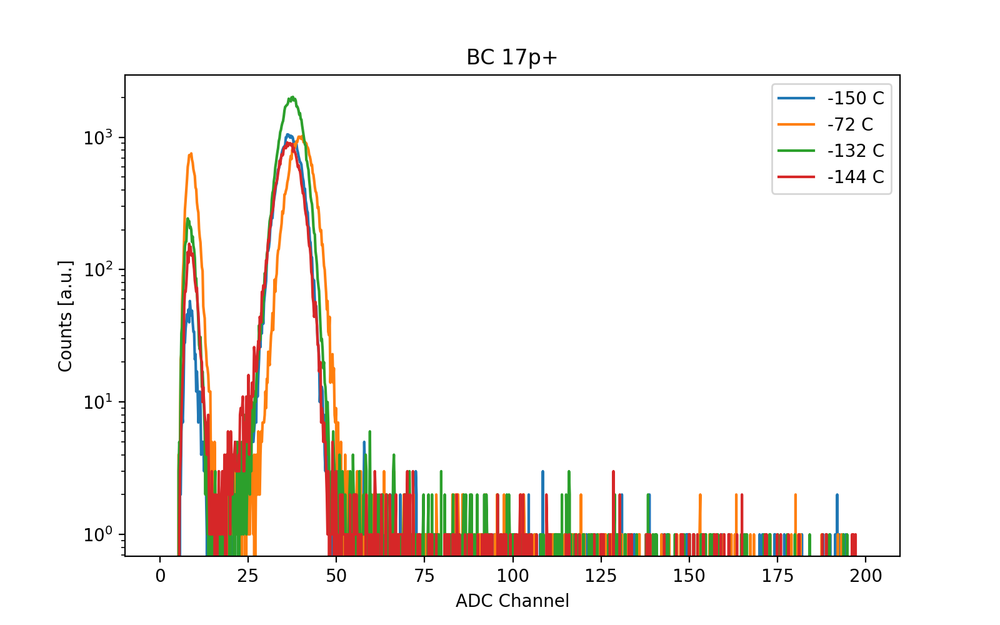

76
76
76
76


<IPython.core.display.Javascript object>


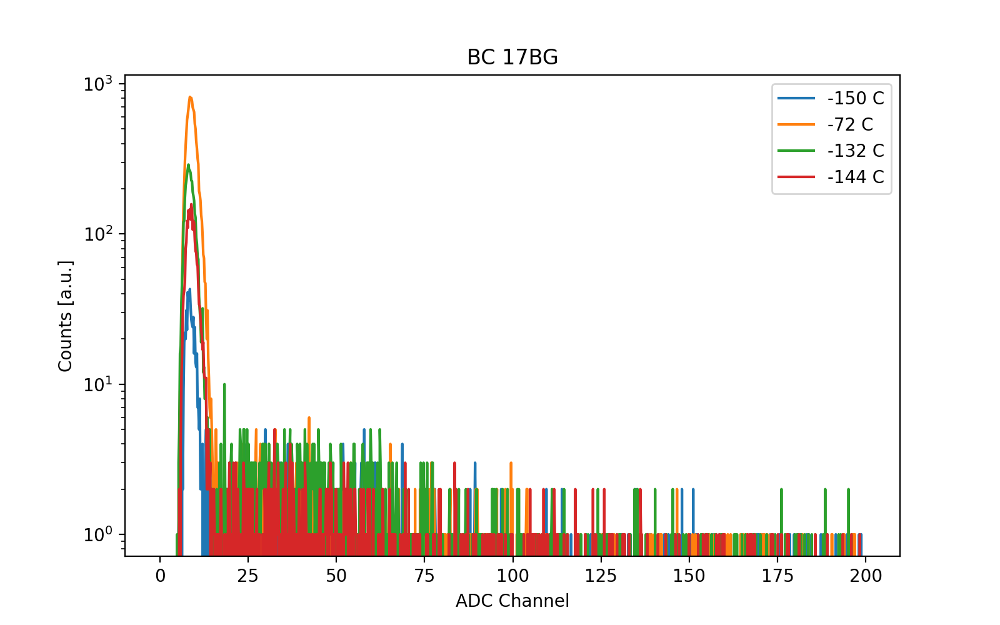

76
76
76
76


<IPython.core.display.Javascript object>


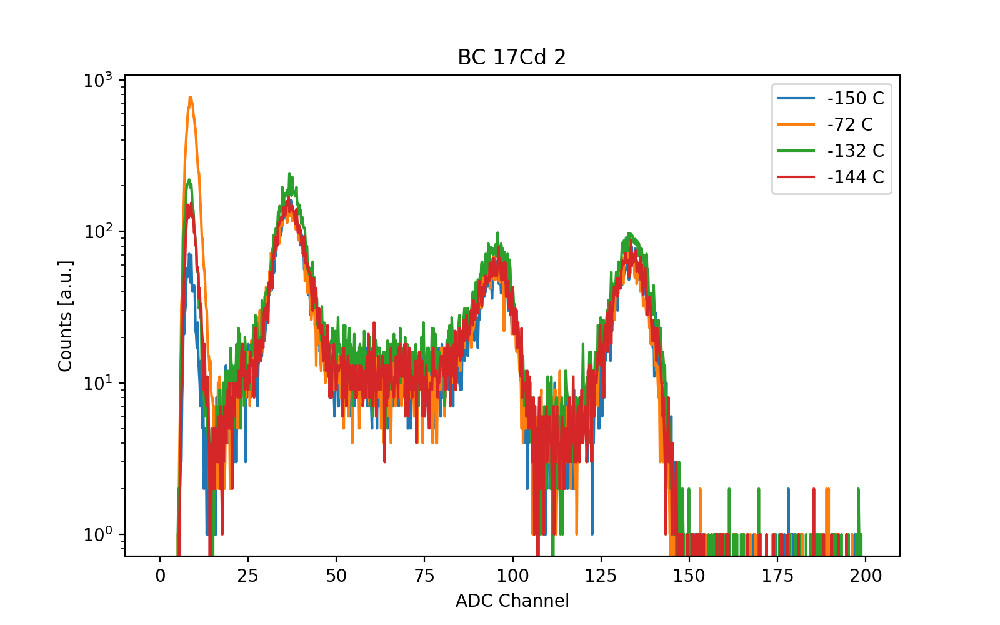

76
76
76
76


<IPython.core.display.Javascript object>


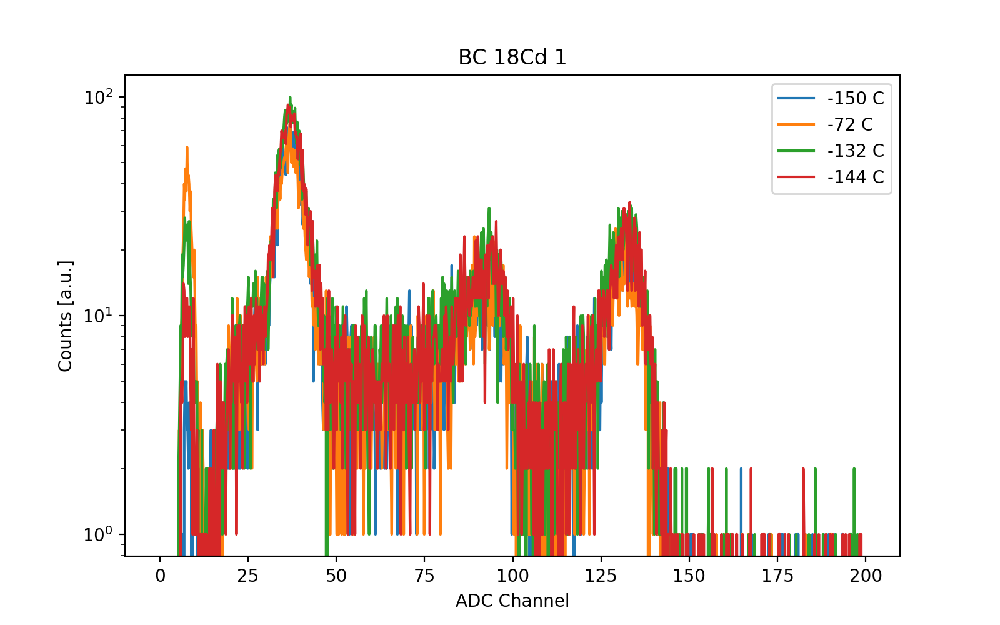

124
124
124
124


<IPython.core.display.Javascript object>


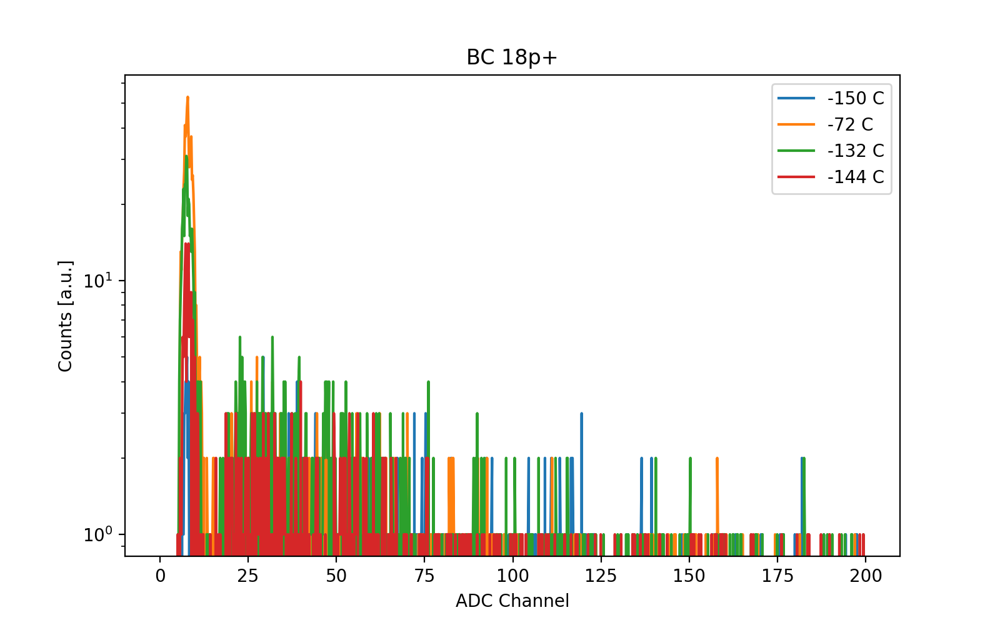

124
124
124
124


<IPython.core.display.Javascript object>


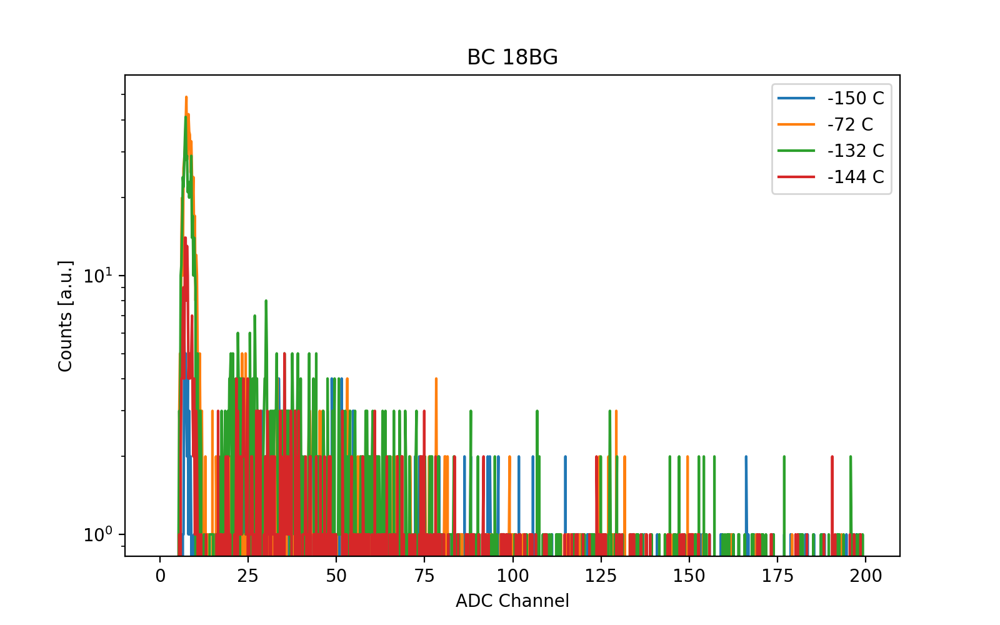

124
124
124
124


<IPython.core.display.Javascript object>


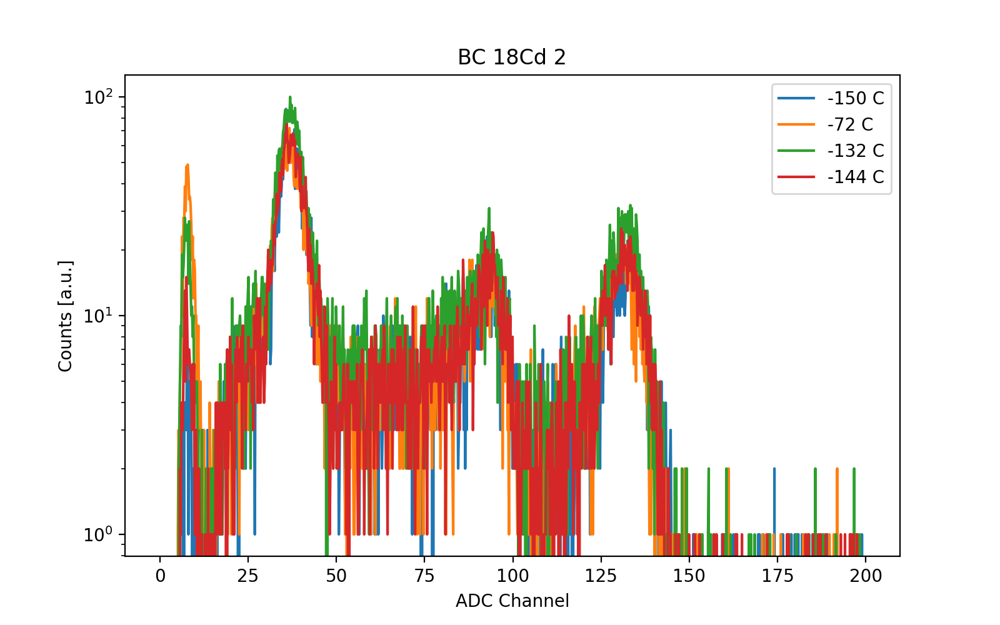

124
124
124
124


<IPython.core.display.Javascript object>


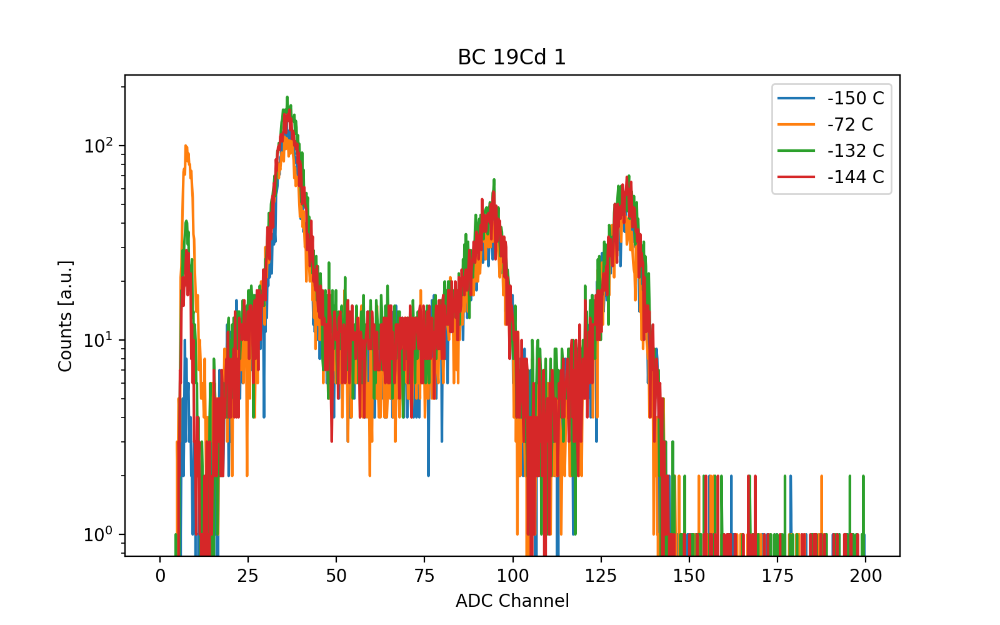

97
97
97
97


<IPython.core.display.Javascript object>


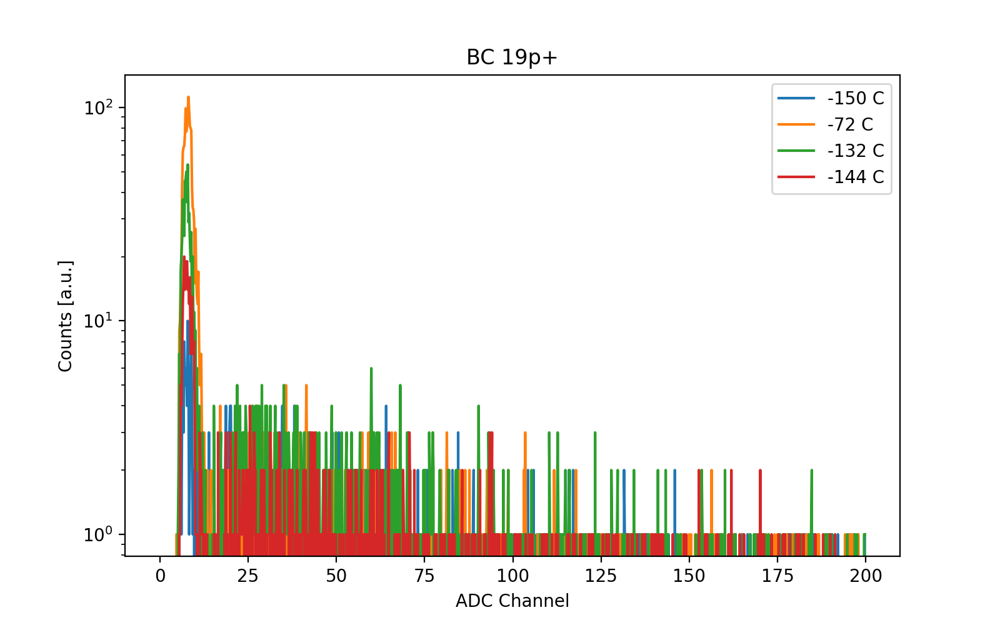

97
97
97
97


<IPython.core.display.Javascript object>


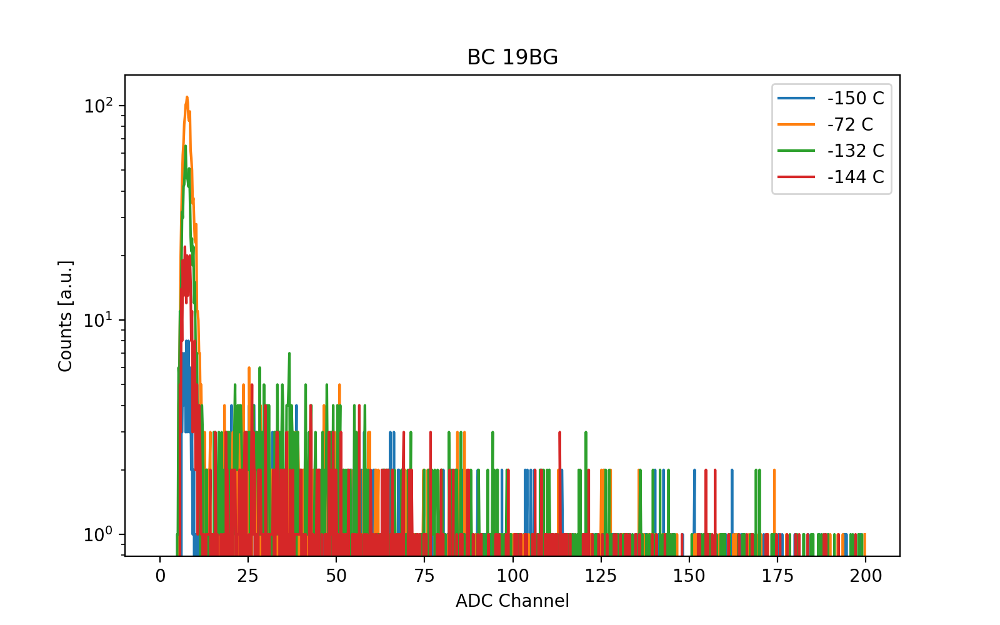

97
97
97
97


<IPython.core.display.Javascript object>


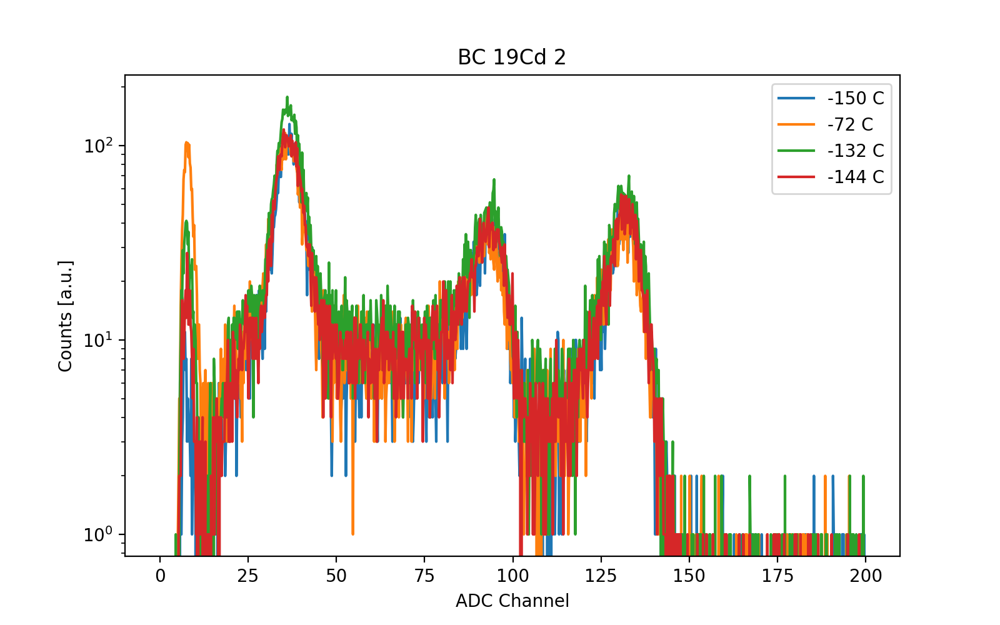

97
97
97
97


<IPython.core.display.Javascript object>


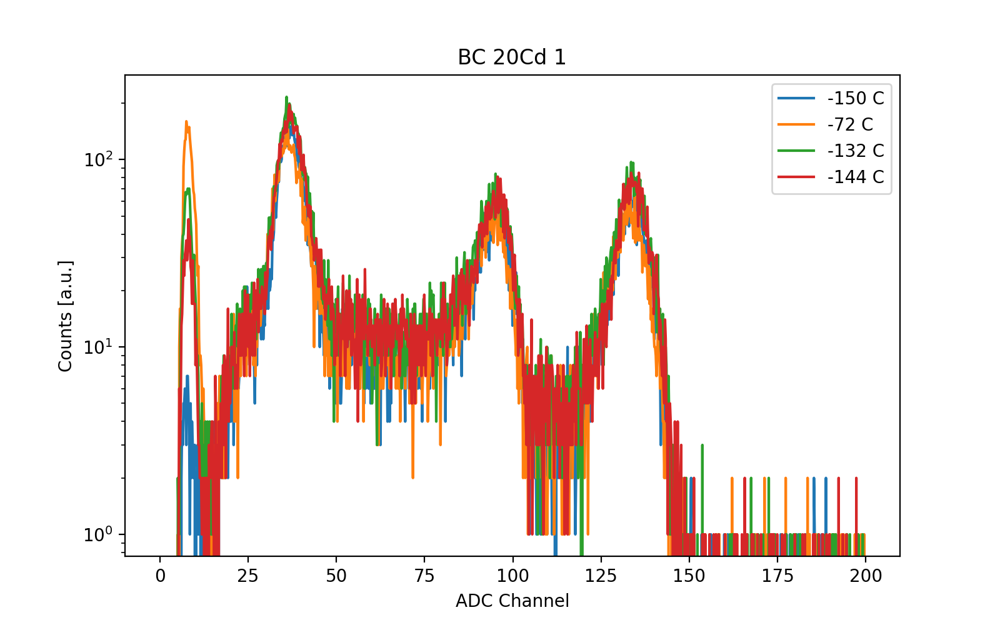

88
88
88
88


<IPython.core.display.Javascript object>


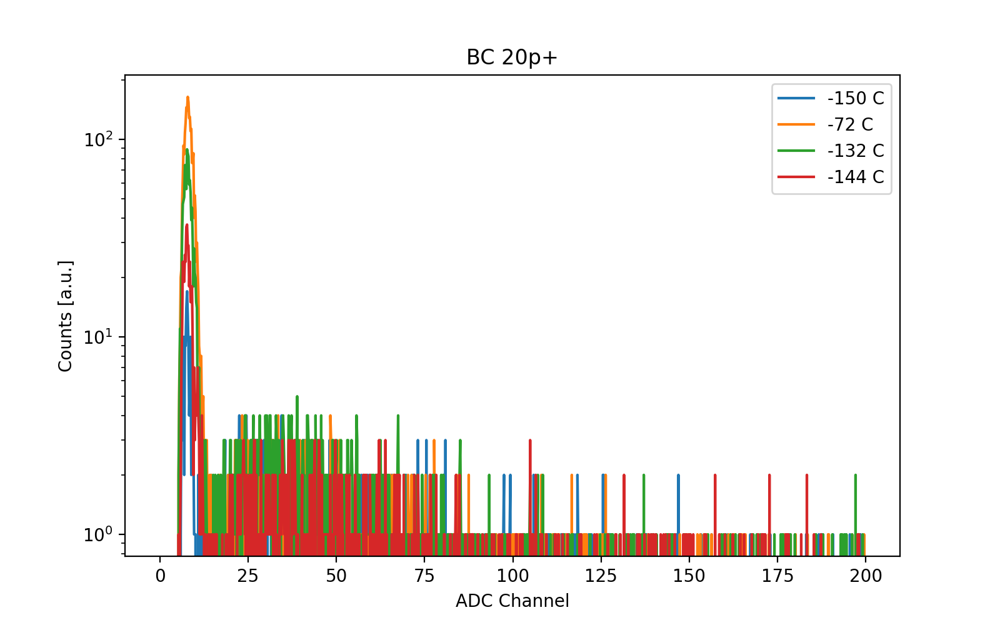

88
88
88
88


<IPython.core.display.Javascript object>


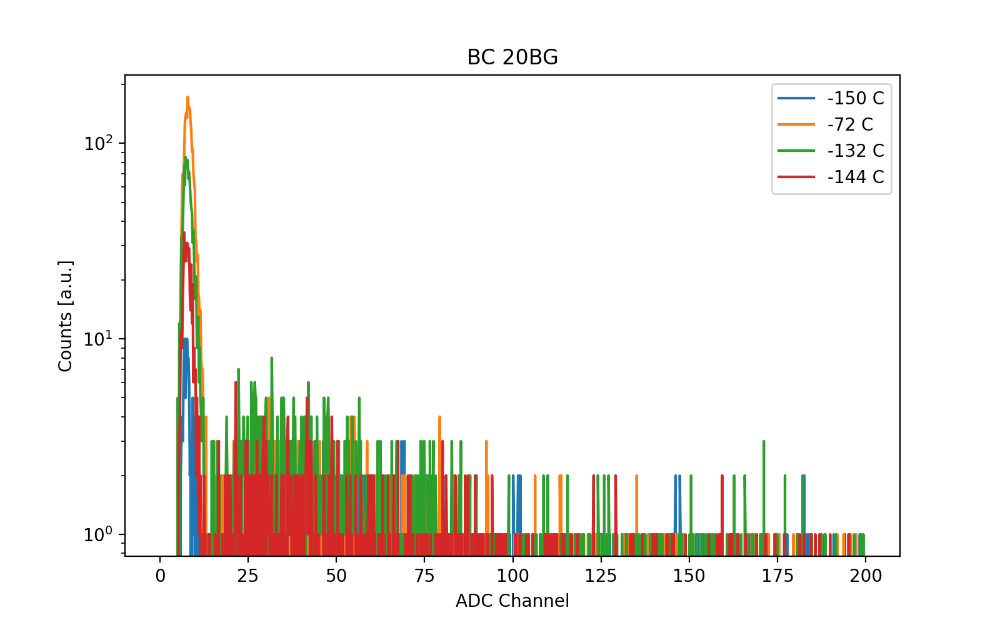

88
88
88
88


<IPython.core.display.Javascript object>


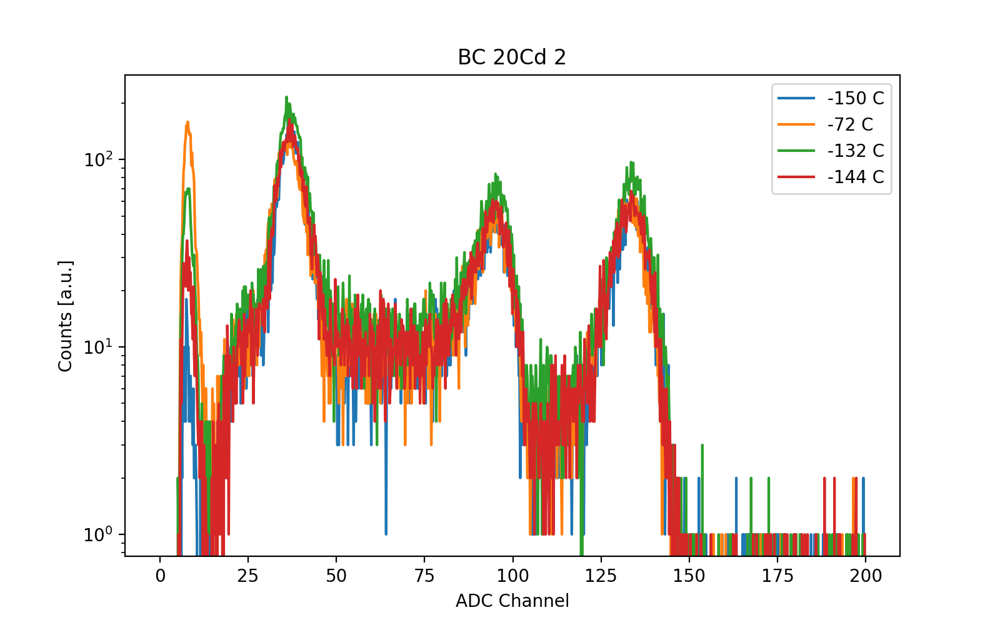

88
88
88
88


<IPython.core.display.Javascript object>


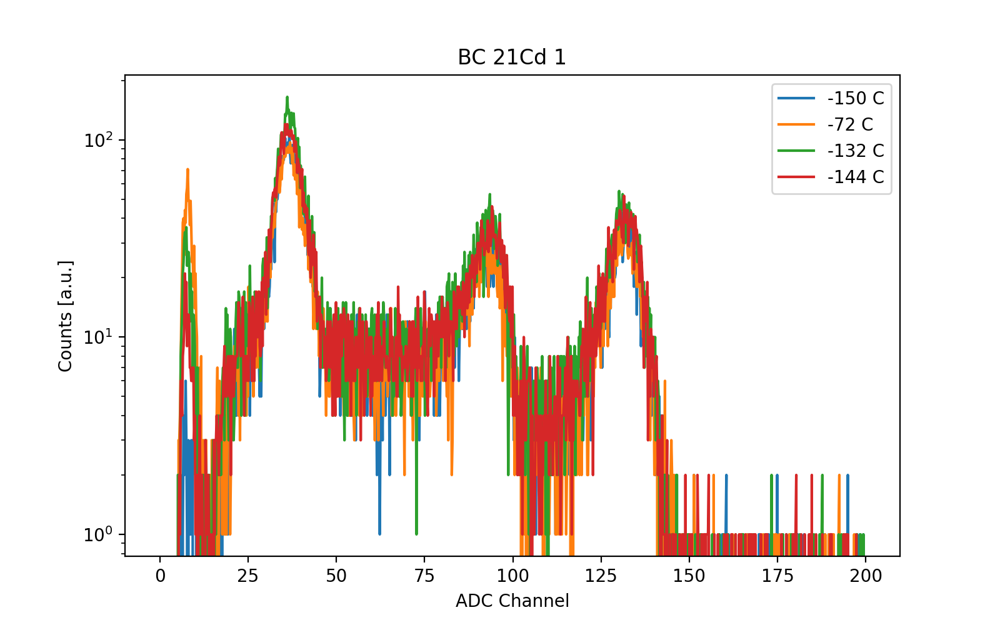

107
107
107
107


<IPython.core.display.Javascript object>


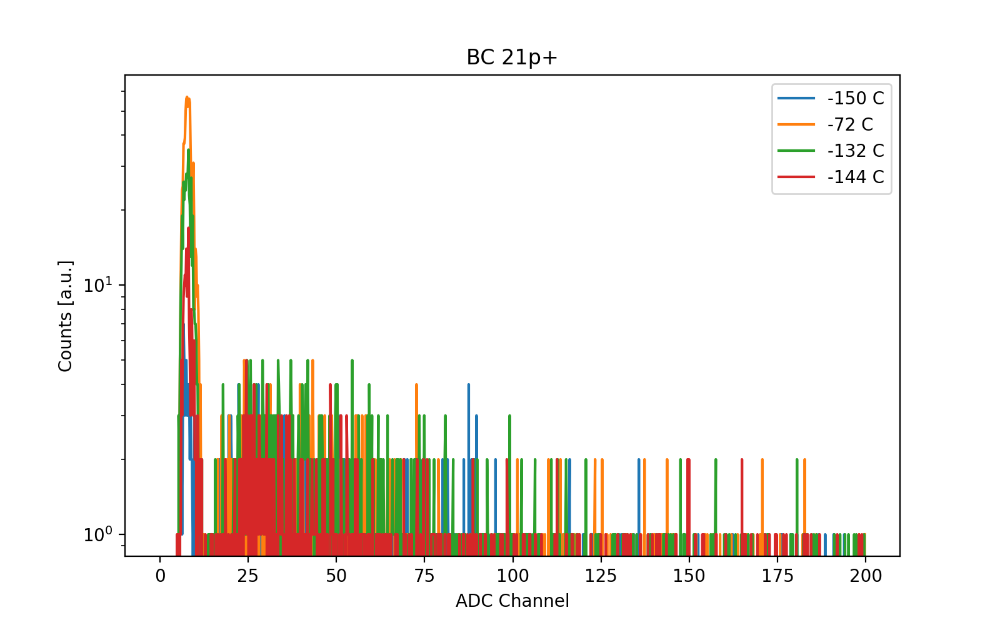

107
107
107
107


<IPython.core.display.Javascript object>


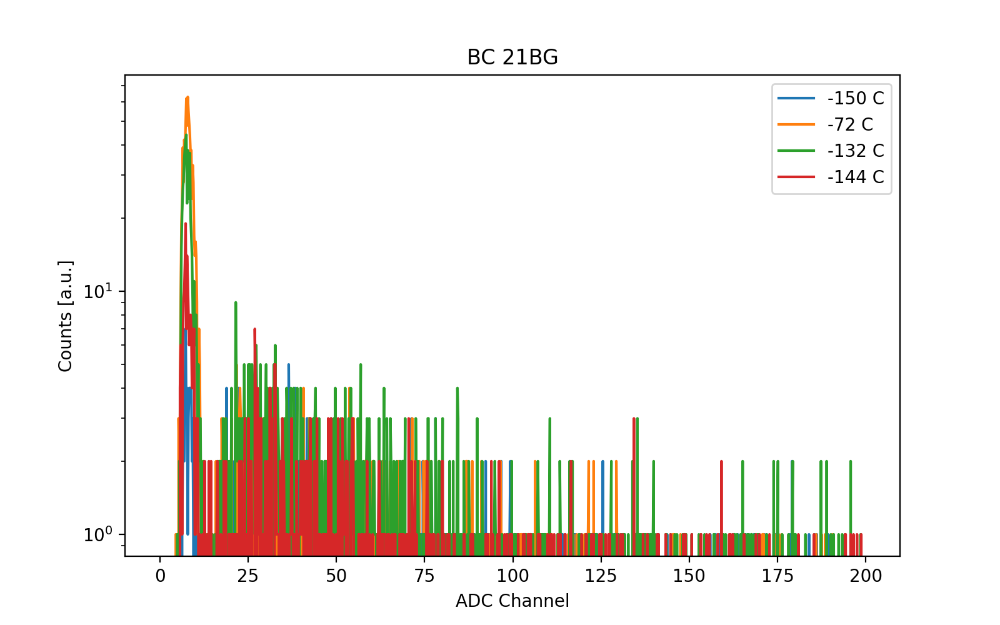

107
107
107
107


<IPython.core.display.Javascript object>


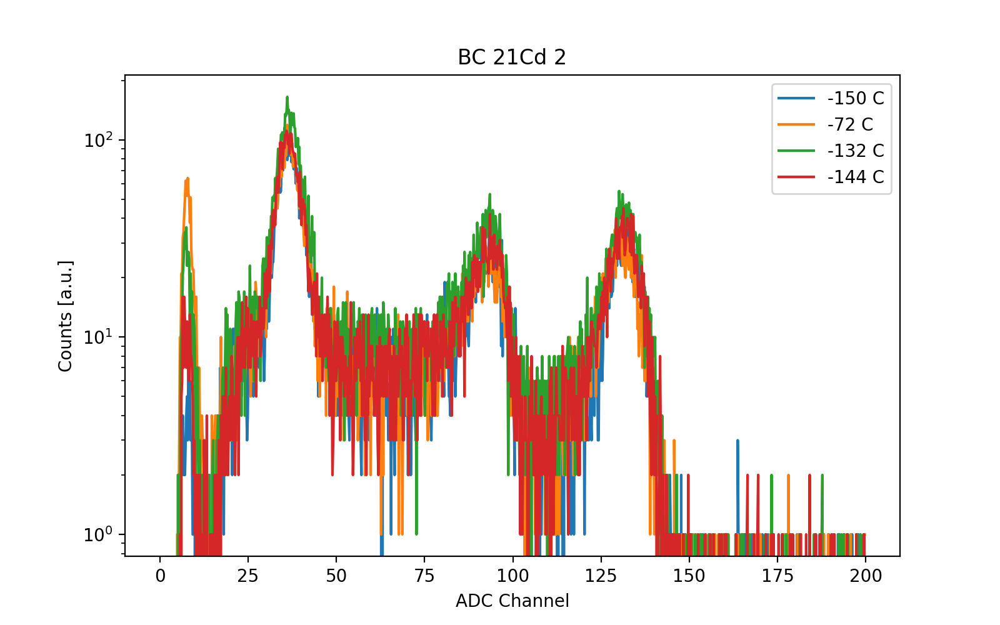

107
107
107
107


<ipython-input-21-b52b4e000e94>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


<IPython.core.display.Javascript object>


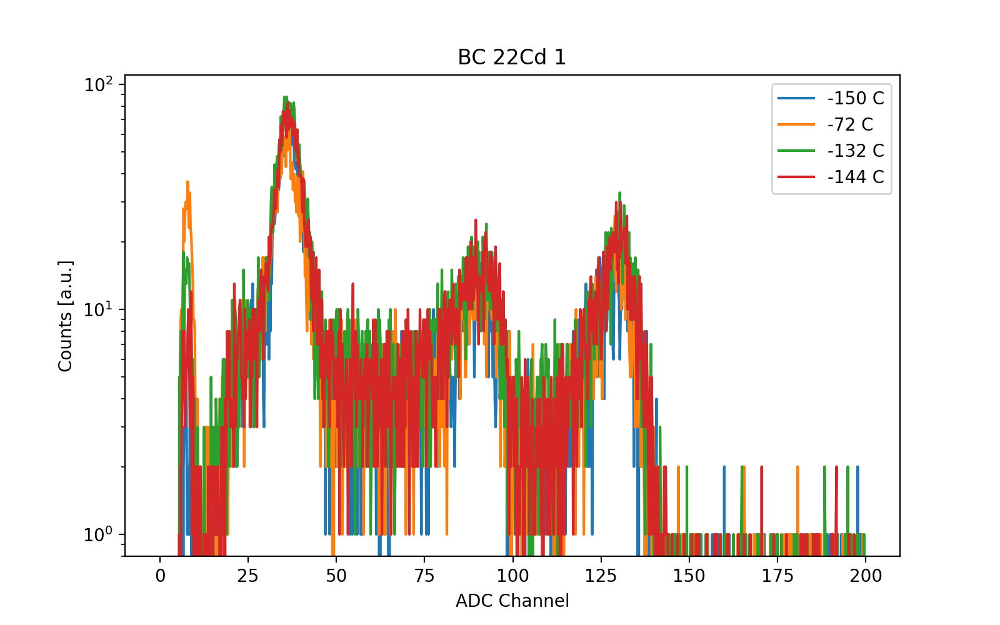

122
122
122
122


<IPython.core.display.Javascript object>


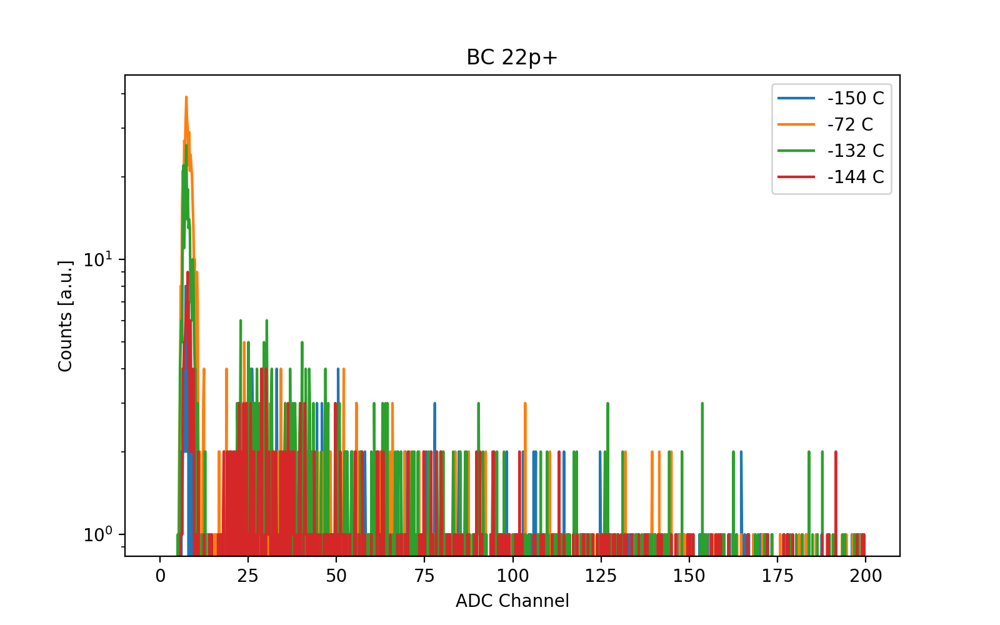

122
122
122
122


<IPython.core.display.Javascript object>


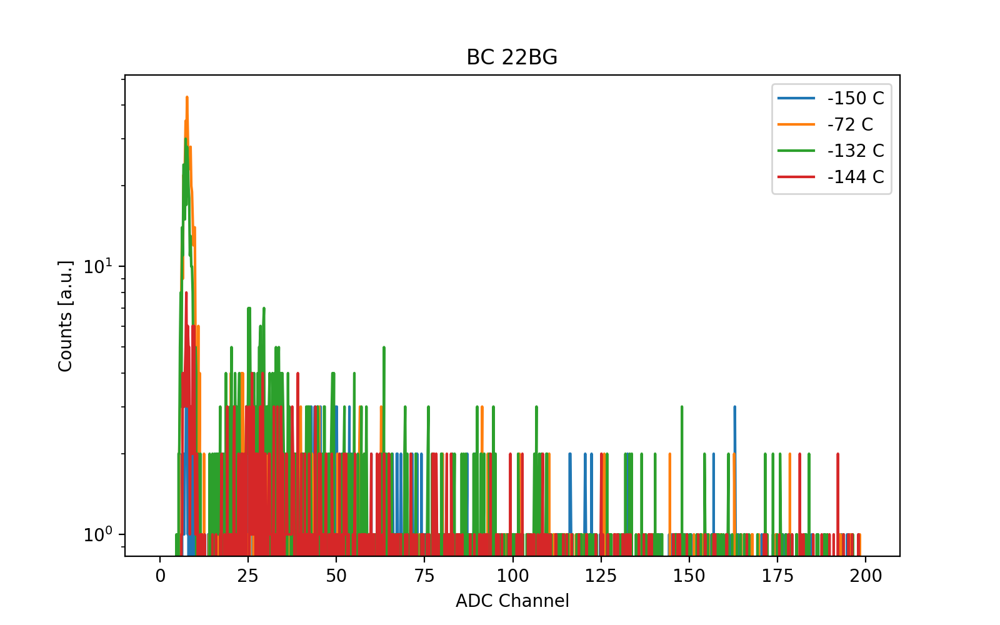

122
122
122
122


<IPython.core.display.Javascript object>


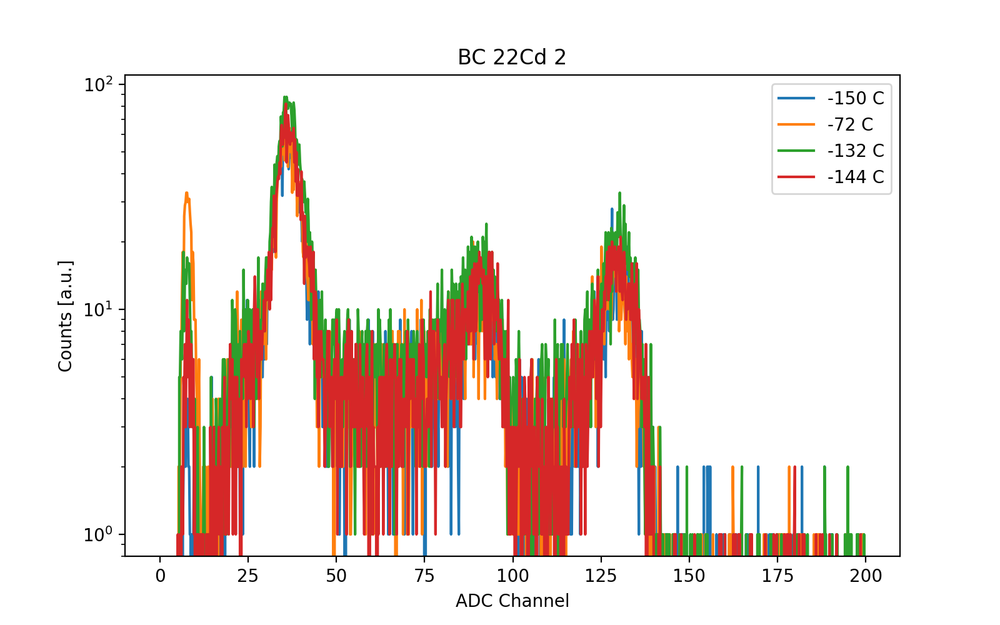

122
122
122
122


In [21]:
pixelMapping = dataRuns[-150]["p+"].parameterFile().BoardChannelPixelMap
for bc in bcs:
    for k in keys:
        plt.figure()
        for t in hitsDict.keys():
            pixel = pixelMapping['pixel'][pixelMapping['bc']==bc][0]
            print(pixel)
            plt.plot(bins[:-1] + binWidth/2, hitsDict[t][k][pixel-1, :], label="%+d C" % t)
        plt.title("BC %d" % bc + k)
        plt.yscale("log")
        plt.xlabel("ADC Channel")
        plt.ylabel("Counts [a.u.]")
        plt.legend(loc=0)
        plt.savefig(figDir + figPrefix + "bc_%d_%s" % (bc, k))

In [22]:
bcs = dataRun.singleWaves().bcs
print('board channels', bcs[0])
print('mapping', bcs[1])
print('counts', bcs[2])

bcs = dataRun.triggers().bcs
print('board channels', bcs[0])
print('mapping', bcs[1])
print('counts', bcs[2])

NameError: name 'dataRun' is not defined

In [23]:
mapping = dataRuns[-150]["p+"].parameterFile().BoardChannelPixelMap
print(mapping)

[(  0,  90) (  1, 110) (  2, 111) (  3, 120) (  4, 127) (  5, 119)
 (  6,  89) (  7,  99) (  8, 108) (  9, 126) ( 10, 117) ( 11, 125)
 ( 12,  98) ( 13, 115) ( 14, 123) ( 15, 109) ( 16, 118) ( 17,  76)
 ( 18, 124) ( 19,  97) ( 20,  88) ( 21, 107) ( 22, 122) ( 23, 116)
 ( 24, 121) ( 25,  96) ( 26, 105) ( 27,  87) ( 28, 113) ( 29,  95)
 ( 30, 104) ( 31, 114) ( 32,  75) ( 33, 106) ( 34,  74) ( 35,  84)
 ( 36,  86) ( 37,  85) ( 38,  71) ( 39,  83) ( 40,  94) ( 41,  61)
 ( 42,  72) ( 43,  64) ( 44,  62) ( 45,  73) ( 46,  60) ( 47,  63)
 ( 48,  48) ( 49,  46) ( 50,  58) ( 51,  49) ( 52,  38) ( 53,  35)
 ( 54,  59) ( 55,  47) ( 56,  50) ( 57,  25) ( 58,  26) ( 59,  28)
 ( 60,  51) ( 61,  16) ( 62,  37) ( 63,  36) ( 64,  27) ( 65,  18)
 ( 66,  17) ( 67,   1) ( 68,   9) ( 69,   8) ( 70,  19) ( 71,  20)
 ( 72,  11) ( 73,   3) ( 74,   4) ( 75,   2) ( 76,  39) ( 77,  21)
 ( 78,   6) ( 79,  10) ( 80,   5) ( 81,  40) ( 82,  12) ( 83,  31)
 ( 84,  52) ( 85,  30) ( 86,  13) ( 87,  29) ( 88,   7) ( 89, 

In [ ]:
dataRun.plotHitLocations(sourceFile = 'trigger', cmap = 'cividis', showNum=True, showVal = True, alpha=0.8, rounding=None)

In [76]:
bcChoice = 17
pixel = pixelMapping['pixel'][pixelMapping['bc']==bcChoice]
fitResultsDict = dict()

for t in hitsDict.keys():
    histPixel = hitsDict[t]["Cd 1"][pixel-1, :][0]
    result22data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (25, 60), plotResults=False)
    result62data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (80, 105), plotResults=False)
    try:
        result84data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (120, 145), plotResults=False)
    except:
        print("Trying again")
        result84data = anal.fitFunction(bins[:-1], histPixel, 'Longoria', (111, 150), plotResults=False)
    fitResultsDict[t] = (result22data, result62data, result84data)

-150
22
175 38.5850207858388 6.496335778465485
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...


/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 70
    # data points      = 175
    # variables        = 8
    chi-square         = 201.245047
    reduced chi-square = 1.20506016
    Akaike info crit   = 40.4540332
    Bayesian info crit = 65.7723210
[[Variables]]
    g_a:          125.979856 +/- 112.433460 (89.25%) (init = 94.93333)
    g_x0:         36.9960994 +/- 0.65143294 (1.76%) (init = 38.58502)
    g_sigma:      3.40697258 +/- 0.14708272 (4.32%) (init = 6.496336)
    st_x0:        36.9960994 +/- 0.65143294 (1.76%) == 'g_x0'
    st_sigma:     3.40697258 +/- 0.14708272 (4.32%) == 'g_sigma'
    st_stepSize:  1.02779423 +/- 6.89191071 (670.55%) (init = 10)
    le_x0:        36.9960994 +/- 0.65143294 (1.76%) == 'g_x0'
    le_sigma:     3.40697258 +/- 0.14708272 (4.32%) == 'g_sigma'
    le_lowexp1:   0.00610498 +/- 1831.4

/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:42: RuntimeWarning: overflow encountered in square
  return stepSize/(1.0+np.exp(tt))**2.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 48
    # data points      = 125
    # variables        = 8
    chi-square         = 130.991644
    reduced chi-square = 1.11958670
    Akaike info crit   = 21.8524744
    Bayesian info crit = 44.4789843
[[Variables]]
    g_a:          65.4416290 +/- 26.4028546 (40.35%) (init = 56.85333)
    g_x0:         133.881887 +/- 1.07883118 (0.81%) (init = 133.1086)
    g_sigma:      3.87027316 +/- 0.66818483 (17.26%) (init = 4.591192)
    st_x0:        133.881887 +/- 1.07883119 (0.81%) == 'g_x0'
    st_sigma:     3.87027316 +/- 0.66818483 (17.26%) == 'g_sigma'
    st_stepSize:  1.29847161 +/- 65.6265813 (5054.14%) (init = 10)
    le_x0:        133.881887 +/- 1.07883119 (0.81%) == 'g_x0'
    le_sigma:     3.87027316 +/- 0.66818483 (17.26%) == 'g_sigma'
    le_lowexp1:   22.4315534 +/- 11

[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 125
    # variables        = 8
    chi-square         = 148.659708
    reduced chi-square = 1.27059580
    Akaike info crit   = 37.6682651
    Bayesian info crit = 60.2947750
[[Variables]]
    g_a:          56.3875421 +/- 91.4033845 (162.10%) (init = 56.69333)
    g_x0:         133.425447 +/- 4.75886241 (3.57%) (init = 132.6755)
    g_sigma:      4.18689725 +/- 1.83331405 (43.79%) (init = 4.772752)
    st_x0:        133.425447 +/- 4.75886242 (3.57%) == 'g_x0'
    st_sigma:     4.18689725 +/- 1.83331405 (43.79%) == 'g_sigma'
    st_stepSize:  6.29310938 +/- 83.7714855 (1331.16%) (init = 10)
    le_x0:        133.425447 +/- 4.75886242 (3.57%) == 'g_x0'
    le_sigma:     4.18689725 +/- 1.83331405 (43.79%) == 'g_sigma'
    le_lowexp1:   0.01067265 +/- 9

[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 175
    # variables        = 8
    chi-square         = 188.341405
    reduced chi-square = 1.12779285
    Akaike info crit   = 28.8573072
    Bayesian info crit = 54.1755950
[[Variables]]
    g_a:          147.351771 +/- 282.423181 (191.67%) (init = 96.74667)
    g_x0:         36.9471088 +/- 3.72189827 (10.07%) (init = 38.62515)
    g_sigma:      3.45449522 +/- 0.77144446 (22.33%) (init = 6.571331)
    st_x0:        36.9471088 +/- 3.72189827 (10.07%) == 'g_x0'
    st_sigma:     3.45449522 +/- 0.77144446 (22.33%) == 'g_sigma'
    st_stepSize:  2.12538648 +/- 50.6344998 (2382.37%) (init = 10)
    le_x0:        36.9471088 +/- 3.72189827 (10.07%) == 'g_x0'
    le_sigma:     3.45449522 +/- 0.77144446 (22.33%) == 'g_sigma'
    le_lowexp1:   4.25759773 +/

In [77]:
print(fitResultsDict.keys())

dict_keys([-150, -72, -132, -144])


# Simulation data

In [27]:
from basic_G4_analysis import *
import uproot
import scipy.linalg as la

In [28]:
figDirSim = "/Users/leenderthayen/git/NDP/analysis/figures/G4/"
figPrefixSim = "109Cd_1_4"

fileDirSim = "/Users/leenderthayen/git/NDP/data/G4/"

fileNameSim = "109Cd_front_UoM_1+4.0_new.root"

In [29]:
fileSim = uproot.open(fileDirSim + fileNameSim)

1it [00:00,  2.52it/s]


<IPython.core.display.Javascript object>


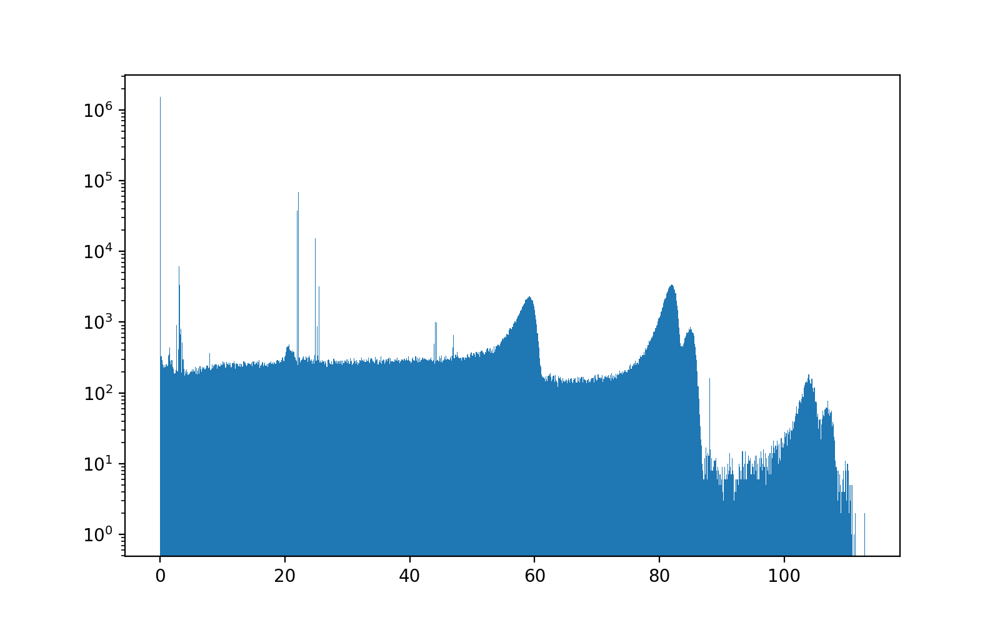

In [30]:
makeHist(fileSim["ntuple/energy"], "enSi")

binWidthSim = 0.1

binsSim = np.arange(0, 100, binWidthSim)

## Charge collection

In [31]:
dl = 1e-4 # 100 nm, in mm

cceHard = lambda z: np.where(z < dl, 0, 1)
cceSoft = lambda z: 1-np.exp(-z/dl/1.15)

<IPython.core.display.Javascript object>


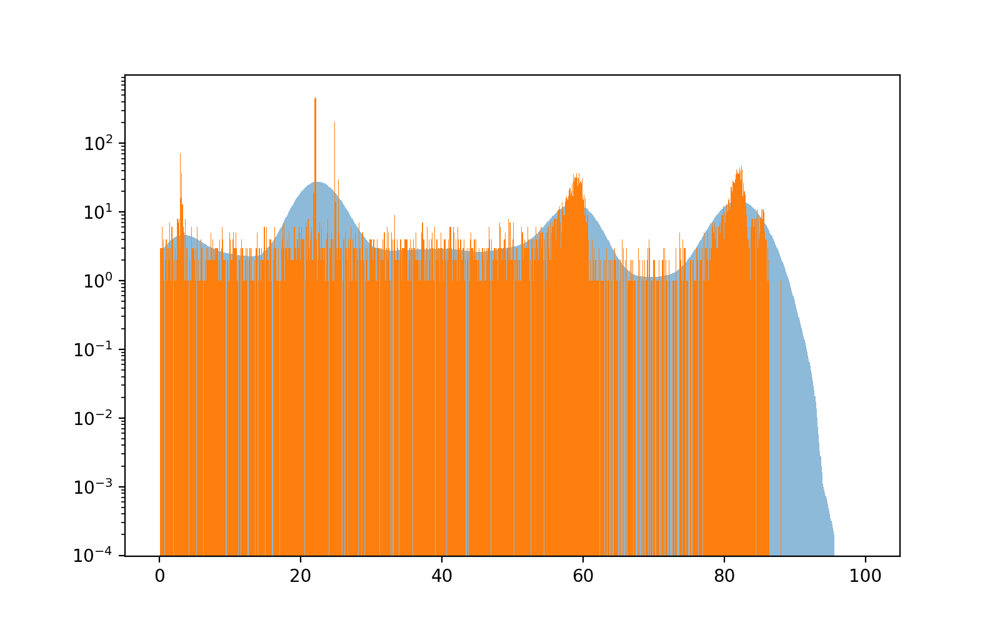

In [32]:
histSim, _ = buildPixelSpectrum(fileSim["ntuple/hits"], 76, cce=cceHard, bins=binsSim, plot=False)
res = convolveHist(histSim[1:], binsSim[1:], 2.5)

In [33]:
results22 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (12, 30), plotResults=False)
results62 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (50, 67), plotResults=True)
results85 = anal.fitFunction(binsSim[:-1], res, 'Longoria', (73, 95), plotResults=False)

180 22.15701780285626 3.3817671483702214
<lmfit.Model: (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...
[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 115
    # data points      = 180
    # variables        = 8
    chi-square         = 0.74237758
    reduced chi-square = 0.00431615
    Akaike info crit   = -972.353747
    Bayesian info crit = -946.810092
[[Variables]]
    g_a:          25.1514761 +/- 1.66544616 (6.62%) (init = 18.94628)
    g_x0:         22.3813407 +/- 0.05847679 (0.26%) (init = 22.15702)
    g_sigma:      2.69966792 +/- 0.03234412 (1.20%) (init = 3.381767)
    st_x0:        22.3813407 +/- 0.05847679 (0.26%) == 'g_x0'
    st_sigma:     2.69966792 +/- 0.03234412 (1.20%) 

/Users/leenderthayen/git/NDP/analysis/utils/fitFunctions.py:46: RuntimeWarning: overflow encountered in power
  return lowexp1*np.exp(lowexp2*tt)/(1+np.exp(tt))**4.0


[[Model]]
    (((Model(gauss, prefix='g_') + Model(stepFunc, prefix='st_')) + Model(lowerExponential, prefix='le_')) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 78
    # data points      = 170
    # variables        = 8
    chi-square         = 0.00524767
    reduced chi-square = 3.2393e-05
    Akaike info crit   = -1749.58092
    Bayesian info crit = -1724.49454
[[Variables]]
    g_a:          10.1833434 +/- 0.40061259 (3.93%) (init = 9.381534)
    g_x0:         59.0217635 +/- 0.05349215 (0.09%) (init = 58.10247)
    g_sigma:      2.68205060 +/- 0.00656946 (0.24%) (init = 3.555744)
    st_x0:        59.0217635 +/- 0.05349215 (0.09%) == 'g_x0'
    st_sigma:     2.68205060 +/- 0.00656946 (0.24%) == 'g_sigma'
    st_stepSize:  1.47931915 +/- 0.19459365 (13.15%) (init = 5.863458)
    le_x0:        59.0217635 +/- 0.05349215 (0.09%) == 'g_x0'
    le_sigma:     2.68205060 +/- 0.00656946 (0.24%) == 'g_sigma'
    le_lowexp1:   23.4523416 +/- 

# Calibration

In [78]:
centroidSim = np.array([x[1].params["g_x0"].value for x in (results22, results62, results85)])
stderrSim = np.array([x[1].params["g_x0"].stderr for x in (results22, results62, results85)])
calibrationDict = dict()
for t in fitResultsDict.keys():
    centroidData = np.array([x[1].params["g_x0"].value for x in fitResultsDict[t]])
    stderrData = np.array([x[1].params["g_x0"].stderr if x[1].params["g_x0"].stderr != None else np.inf for x in fitResultsDict[t]])
    polyres, polycov = np.polyfit(centroidData, centroidSim, 1, w=1./stderrData, cov=True)
    fit = np.poly1d(polyres)
    fiterr = np.sqrt(np.diag(polycov))
    calibrationDict[t] = (centroidData, stderrData, fit, fiterr)

<IPython.core.display.Javascript object>


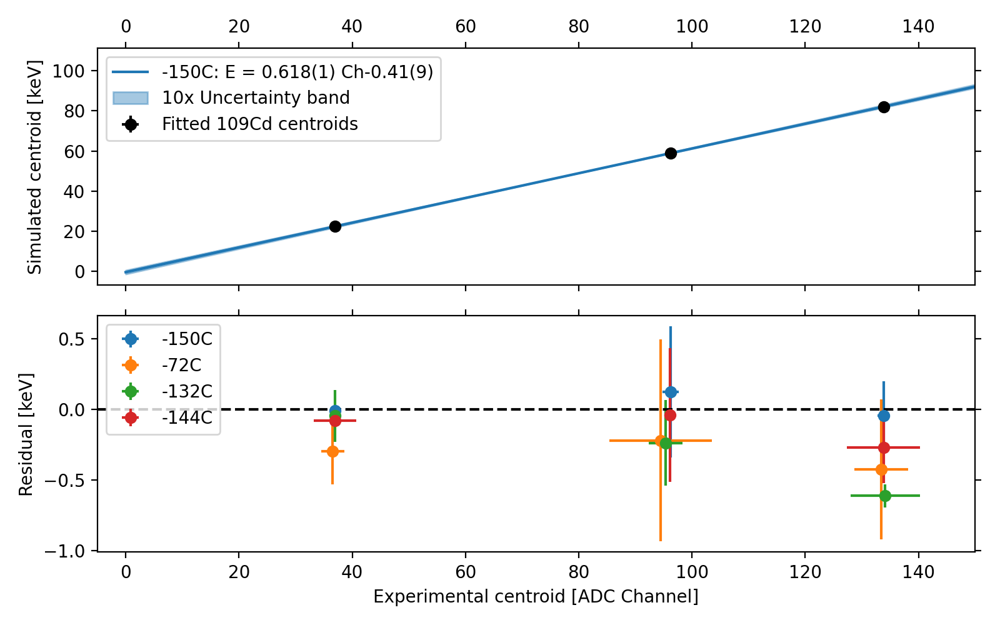

In [93]:
centroidData, stderrData, fit, fiterr = calibrationDict[-150]
fig, ax = plt.subplots(2, 1, sharex=True)
ax[0].errorbar(centroidData, centroidSim, yerr=stderrData, xerr=stderrSim, fmt="ko", label="Fitted 109Cd centroids")
x = np.linspace(0, 170, 100)
ax[0].plot(x, fit(x), 'C0-', label="-150C: E = %.3f(%d) Ch%+.2f(%d)" % (polyres[0], fiterr[0]*1e3, polyres[1], fiterr[1]*1e2))
ax[0].fill_between(x, np.poly1d(polyres+[10*fiterr[0], -10*fiterr[1]])(x), np.poly1d(polyres+[-10*fiterr[0], 10*fiterr[1]])(x), color="C0", alpha=0.4, label="10x Uncertainty band")
for t in calibrationDict.keys():
    ax[1].errorbar(calibrationDict[t][0], centroidSim-calibrationDict[t][2](centroidData), yerr=calibrationDict[t][2](stderrData), fmt="o", xerr=calibrationDict[t][1], label="%+dC" % t)
ax[1].hlines(0, -10, 170, color="k", ls="--")
ax[0].legend(loc=0)
ax[1].legend(loc=0)
ax[1].set_xlim((-5, 150))
ax[0].tick_params(labelbottom=False, labeltop=True, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)
ax[1].tick_params(labelbottom=True, labeltop=False, labelleft=True, labelright=False,
                     bottom=True, top=True, left=True, right=True)

ax[0].set_ylabel("Simulated centroid [keV]")
ax[1].set_ylabel("Residual [keV]")
ax[1].set_xlabel("Experimental centroid [ADC Channel]")

#ax[1].text(centroidData[0]-5, -1, "%.1f(%d)" % (centroidData[0]-centroidDataWarm[0], 10*np.sqrt(stderrData[0]**2+stderrDataWarm[0]**2)))
#ax[1].text(centroidData[1]-5, -1, "%.1f(%d)" % (centroidData[1]-centroidDataWarm[1], 10*np.sqrt(stderrData[1]**2+stderrDataWarm[1]**2)))
#ax[1].text(centroidData[2]-7, -1, "%.1f(%d)" % (centroidData[2]-centroidDataWarm[2], 10*np.sqrt(stderrData[2]**2+stderrDataWarm[2]**2)))
#ax[1].text(0, -1, "Centroid shift:")
fig.tight_layout()
fig.savefig(figDirSim + figPrefixSim + "px76_109Cd_calibration_temp_excursion.pdf")

<IPython.core.display.Javascript object>


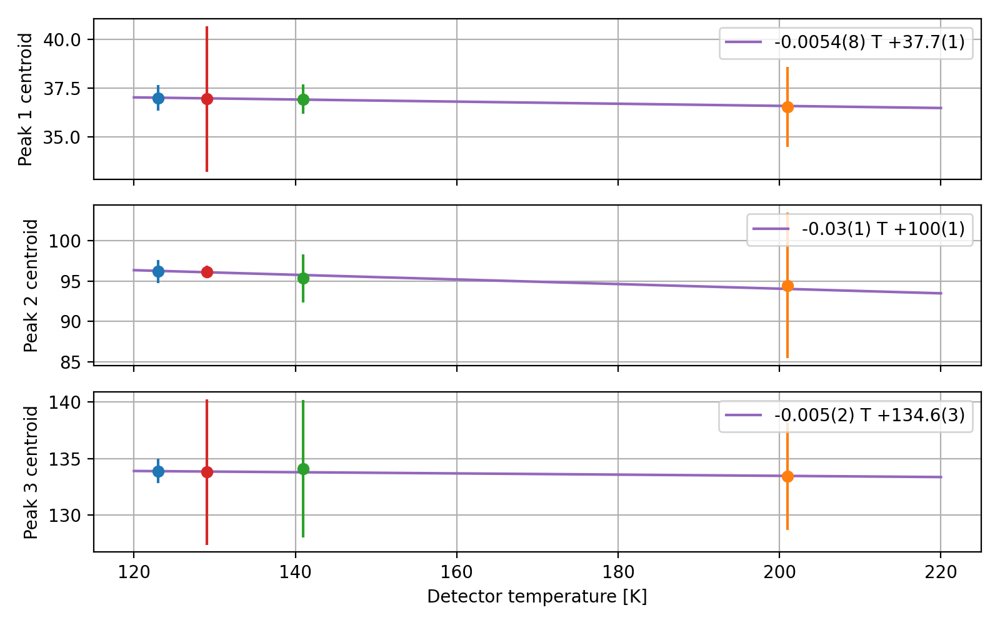

[36.99609943 36.54461127 36.93591161 36.9471088 ]
[0.0008197  0.11124327]
[0.00237023 0.30418555]


In [136]:
fig, ax = plt.subplots(3, 1, sharex=True)
for t in calibrationDict.keys():
    ax[0].errorbar(t+273, calibrationDict[t][0][0], fmt="o", yerr=calibrationDict[t][1][0])
    ax[1].errorbar(t+273, calibrationDict[t][0][1], fmt="o", yerr=calibrationDict[t][1][1])
    ax[2].errorbar(t+273, calibrationDict[t][0][2], fmt="o", yerr=calibrationDict[t][1][2])
ax[0].set_ylabel("Peak 1 centroid")
ax[1].set_ylabel("Peak 2 centroid")
ax[2].set_ylabel("Peak 3 centroid")
ax[2].set_xlabel("Detector temperature [K]")
ax[0].grid()
ax[1].grid()
ax[2].grid()
fig.tight_layout()

T = np.linspace(120, 220, 100)
peaks1 = np.array([(calibrationDict[x][0][0], calibrationDict[x][1][0]) for x in calibrationDict.keys()])
peaks2 = np.array([(calibrationDict[x][0][1], calibrationDict[x][1][1]) for x in calibrationDict.keys()])
peaks3 = np.array([(calibrationDict[x][0][2], calibrationDict[x][1][2]) for x in calibrationDict.keys()])
print(peaks1[:, 0])

polyres1, polycov1 = np.polyfit([x + 273 for x in calibrationDict.keys()], peaks1[:, 0], 1, w=1./peaks1[:, 1], cov=True)
fit1 = np.poly1d(polyres1)
fiterr1 = np.sqrt(np.diag(polycov1))
polyres2, polycov2 = np.polyfit([x + 273 for x in calibrationDict.keys()], peaks2[:, 0], 1, w=1./peaks2[:, 1], cov=True)
fit2 = np.poly1d(polyres2)
fiterr2 = np.sqrt(np.diag(polycov2))
polyres3, polycov3 = np.polyfit([x + 273 for x in calibrationDict.keys()], peaks3[:, 0], 1, w=1./peaks3[:, 1], cov=True)
fit3 = np.poly1d(polyres3)
fiterr3 = np.sqrt(np.diag(polycov3))
print(fiterr1)
ax[0].plot(T, fit1(T), label="%.4f(%d) T %+.1f(%d)" % (polyres1[0], fiterr1[0]*10000, polyres1[1], fiterr1[1]*10))
ax[0].legend(loc=0)
ax[1].plot(T, fit2(T), label="%.2f(%d) T %+.0f(%d)" % (polyres2[0], fiterr2[0]*100, polyres2[1], fiterr2[1]))
ax[1].legend(loc=0)
ax[2].plot(T, fit3(T), label="%.3f(%d) T %+.1f(%d)" % (polyres3[0], fiterr3[0]*1000, polyres3[1], fiterr3[1]*10))
ax[2].legend(loc=0)
fig.savefig(figDirSim + figPrefixSim + "px76_temp_excursion_peaks_vs_T.pdf")
print(fiterr3)

In [127]:
resultsP = dict()
for t in hitsDict.keys():
    histPixel = hitsDict[t]["p+"][pixel-1, :][0]
    resultsP[t] = anal.fitFunction(bins[:-1], histPixel, 'Gaussian + BG', (25, 60), plotResults=False)

175 36.83558162267839 3.1177756273284496
<lmfit.Model: (Model(gauss) + Model(linearBG))>
Zeros in Errs (array([], dtype=int64),)
Starting minimisation...
[[Model]]
    (Model(gauss) + Model(linearBG))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 31
    # data points      = 175
    # variables        = 5
    chi-square         = 137.703202
    reduced chi-square = 0.81001883
    Akaike info crit   = -31.9449307
    Bayesian info crit = -16.1210009
[[Variables]]
    a:       1022.42510 +/- 5.81753289 (0.57%) (init = 1051)
    x0:      36.8295450 +/- 0.01405445 (0.04%) (init = 36.83558)
    sigma:   3.00244766 +/- 0.01103859 (0.37%) (init = 1.558888)
    slope:  -0.08424530 +/- 0.01912662 (22.70%) (init = 0)
    offset:  5.15803817 +/- 1.01932403 (19.76%) (init = 18.97)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, offset) = -0.993
    C(a, sigma)      = -0.571
    C(sigma, offset) = -0.386
    C(sigma, slope)  =  0.369
    C(x0, slope

<IPython.core.display.Javascript object>


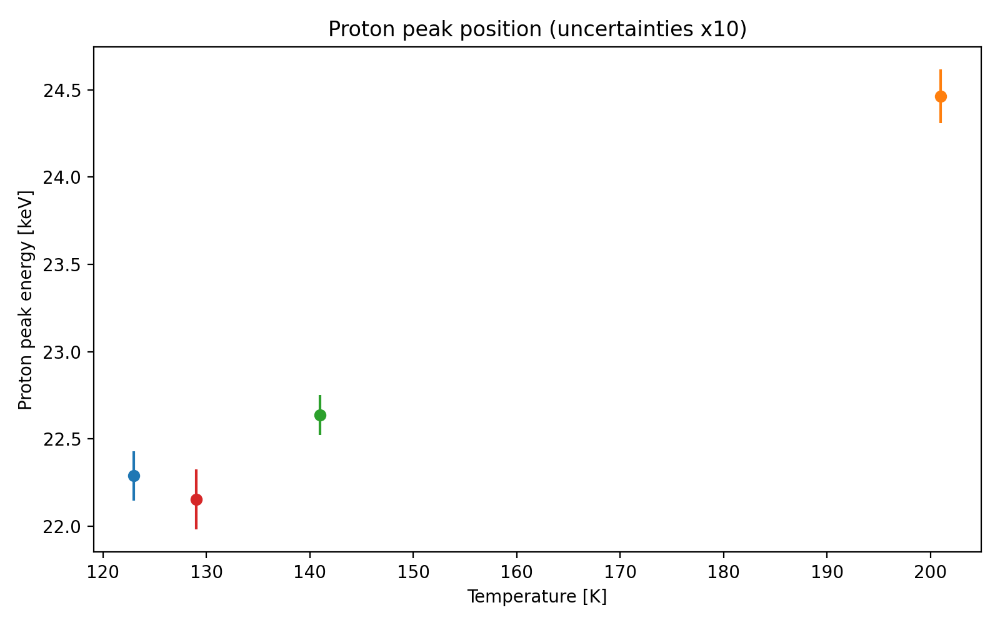

In [134]:
plt.figure()
for t in resultsP.keys():
    plt.errorbar(t+273, calibrationDict[t][2](resultsP[t][1].params["x0"].value), yerr=resultsP[t][1].params["x0"].stderr*10, fmt="o")
plt.title("Proton peak position (uncertainties x10)")
plt.xlabel("Temperature [K]")
plt.ylabel("Proton peak energy [keV]")
plt.tight_layout()
plt.savefig(figDirSim + figPrefixSim + "px76_calibrated_proton_peak_pos_T.pdf")